# Power Outage Duration Analysis

**Name(s)**: Srinivas Sriram

**Website Link**: https://srinisriram.github.io/outage_duration_analysis/

In [48]:
import pandas as pd
import numpy as np
from pathlib import Path
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import root_mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder, StandardScaler, QuantileTransformer, PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor

import plotly.express as px
pd.options.plotting.backend = 'plotly'

# from dsc80_utils import * # Feel free to uncomment and use this.

## Step 1: Introduction

In [49]:
# load dataset
outage_df = pd.read_csv('outage_dataset.csv')
outage_df.head()

,OBS,YEAR,MONTH,U.S._STATE,POSTAL.CODE,NERC.REGION,CLIMATE.REGION,ANOMALY.LEVEL,CLIMATE.CATEGORY,OUTAGE.START.DATE,...,POPPCT_URBAN,POPPCT_UC,POPDEN_URBAN,POPDEN_UC,POPDEN_RURAL,AREAPCT_URBAN,AREAPCT_UC,PCT_LAND,PCT_WATER_TOT,PCT_WATER_INLAND
0,1,2011,7.0,Minnesota,MN,MRO,East North Central,-0.3,normal,"Friday, July 01, 2011",...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743
1,2,2014,5.0,Minnesota,MN,MRO,East North Central,-0.1,normal,"Sunday, May 11, 2014",...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743
2,3,2010,10.0,Minnesota,MN,MRO,East North Central,-1.5,cold,"Tuesday, October 26, 2010",...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743
3,4,2012,6.0,Minnesota,MN,MRO,East North Central,-0.1,normal,"Tuesday, June 19, 2012",...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743
4,5,2015,7.0,Minnesota,MN,MRO,East North Central,1.2,warm,"Saturday, July 18, 2015",...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743


In [50]:
len(outage_df)

1534

In this project, I aim to examine how different factors, like state, year, time, cause, etc., influence the duration of the outage, as well as build a predictive model that can be implemented using these features to predict the duration of a given outage.

## Step 2: Data Cleaning and Exploratory Data Analysis

Cleaning Procedure:
1. Examined null distribution across columns
2. Checked for any null-like values to replace, none present
3. Created start, restoration, and duration columns

In [51]:
outage_df.columns

Index(['OBS', 'YEAR', 'MONTH', 'U.S._STATE', 'POSTAL.CODE', 'NERC.REGION',
       'CLIMATE.REGION', 'ANOMALY.LEVEL', 'CLIMATE.CATEGORY',
       'OUTAGE.START.DATE', 'OUTAGE.START.TIME', 'OUTAGE.RESTORATION.DATE',
       'OUTAGE.RESTORATION.TIME', 'CAUSE.CATEGORY', 'CAUSE.CATEGORY.DETAIL',
       'HURRICANE.NAMES', 'OUTAGE.DURATION', 'DEMAND.LOSS.MW',
       'CUSTOMERS.AFFECTED', 'RES.PRICE', 'COM.PRICE', 'IND.PRICE',
       'TOTAL.PRICE', 'RES.SALES', 'COM.SALES', 'IND.SALES', 'TOTAL.SALES',
       'RES.PERCEN', 'COM.PERCEN', 'IND.PERCEN', 'RES.CUSTOMERS',
       'COM.CUSTOMERS', 'IND.CUSTOMERS', 'TOTAL.CUSTOMERS', 'RES.CUST.PCT',
       'COM.CUST.PCT', 'IND.CUST.PCT', 'PC.REALGSP.STATE', 'PC.REALGSP.USA',
       'PC.REALGSP.REL', 'PC.REALGSP.CHANGE', 'UTIL.REALGSP', 'TOTAL.REALGSP',
       'UTIL.CONTRI', 'PI.UTIL.OFUSA', 'POPULATION', 'POPPCT_URBAN',
       'POPPCT_UC', 'POPDEN_URBAN', 'POPDEN_UC', 'POPDEN_RURAL',
       'AREAPCT_URBAN', 'AREAPCT_UC', 'PCT_LAND', 'PCT_WATER_TOT',
    

In [52]:
# set OBS as index
outage_df = outage_df.set_index('OBS')

In [53]:
# check each column for missing values
for col in outage_df.columns:
    na_count = outage_df[col].isna().sum()
    print(f"Column {col} has {na_count} null values.")

Column YEAR has 0 null values.
Column MONTH has 9 null values.
Column U.S._STATE has 0 null values.
Column POSTAL.CODE has 0 null values.
Column NERC.REGION has 0 null values.
Column CLIMATE.REGION has 6 null values.
Column ANOMALY.LEVEL has 9 null values.
Column CLIMATE.CATEGORY has 9 null values.
Column OUTAGE.START.DATE has 9 null values.
Column OUTAGE.START.TIME has 9 null values.
Column OUTAGE.RESTORATION.DATE has 58 null values.
Column OUTAGE.RESTORATION.TIME has 58 null values.
Column CAUSE.CATEGORY has 0 null values.
Column CAUSE.CATEGORY.DETAIL has 471 null values.
Column HURRICANE.NAMES has 1462 null values.
Column OUTAGE.DURATION has 58 null values.
Column DEMAND.LOSS.MW has 705 null values.
Column CUSTOMERS.AFFECTED has 443 null values.
Column RES.PRICE has 22 null values.
Column COM.PRICE has 22 null values.
Column IND.PRICE has 22 null values.
Column TOTAL.PRICE has 22 null values.
Column RES.SALES has 22 null values.
Column COM.SALES has 22 null values.
Column IND.SALES 

In [54]:
# check for null-like values
print((outage_df == "").sum().sum())
print(outage_df.isin(["None", "none", "Unknown", "unknown", "N/A", "n/a"]).sum().sum())
# 0 for all categories

0
0


In [55]:
# Convert necessary columns to pd.Timestamp columns
# Create OUTAGE.START timestamp
valid_start = outage_df['OUTAGE.START.DATE'].notna() & outage_df['OUTAGE.START.TIME'].notna()
outage_df.loc[valid_start, 'OUTAGE.START'] = pd.to_datetime(
    outage_df.loc[valid_start, 'OUTAGE.START.DATE'].astype(str) + ' ' +
    outage_df.loc[valid_start, 'OUTAGE.START.TIME'].astype(str)
)

# Create OUTAGE.RESTORATION timestamp
valid_end = outage_df['OUTAGE.RESTORATION.DATE'].notna() & outage_df['OUTAGE.RESTORATION.TIME'].notna()
outage_df.loc[valid_end, 'OUTAGE.RESTORATION'] = pd.to_datetime(
    outage_df.loc[valid_end, 'OUTAGE.RESTORATION.DATE'].astype(str) + ' ' +
    outage_df.loc[valid_end, 'OUTAGE.RESTORATION.TIME'].astype(str)
)

/var/folders/kz/wrgztv1x1656x5blwnl0h9cr0000gp/T/ipykernel_41339/3202033876.py:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

/var/folders/kz/wrgztv1x1656x5blwnl0h9cr0000gp/T/ipykernel_41339/3202033876.py:11: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



In [56]:
# create outage duration column (in hours)
outage_df['OUTAGE.DURATION'] = (outage_df['OUTAGE.RESTORATION'] - outage_df['OUTAGE.START']).dt.total_seconds() / 3600

In [57]:
outage_df.head()

,YEAR,MONTH,U.S._STATE,POSTAL.CODE,NERC.REGION,CLIMATE.REGION,ANOMALY.LEVEL,CLIMATE.CATEGORY,OUTAGE.START.DATE,OUTAGE.START.TIME,...,POPDEN_URBAN,POPDEN_UC,POPDEN_RURAL,AREAPCT_URBAN,AREAPCT_UC,PCT_LAND,PCT_WATER_TOT,PCT_WATER_INLAND,OUTAGE.START,OUTAGE.RESTORATION
OBS,,,,,,,,,,,,,,,,,,,,,
1,2011,7.0,Minnesota,MN,MRO,East North Central,-0.3,normal,"Friday, July 01, 2011",5:00:00 PM,...,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743,2011-07-01 17:00:00,2011-07-03 20:00:00
2,2014,5.0,Minnesota,MN,MRO,East North Central,-0.1,normal,"Sunday, May 11, 2014",6:38:00 PM,...,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743,2014-05-11 18:38:00,2014-05-11 18:39:00
3,2010,10.0,Minnesota,MN,MRO,East North Central,-1.5,cold,"Tuesday, October 26, 2010",8:00:00 PM,...,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743,2010-10-26 20:00:00,2010-10-28 22:00:00
4,2012,6.0,Minnesota,MN,MRO,East North Central,-0.1,normal,"Tuesday, June 19, 2012",4:30:00 AM,...,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743,2012-06-19 04:30:00,2012-06-20 23:00:00
5,2015,7.0,Minnesota,MN,MRO,East North Central,1.2,warm,"Saturday, July 18, 2015",2:00:00 AM,...,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743,2015-07-18 02:00:00,2015-07-19 07:00:00


For my univariate plots, I chose to examine the following distributions:
1. Distribution of outage duration to examine any skewness, modality, and spread of the duration column, the one we will be using for future analysis.
2. Distribution of cause category, to see which categories are the most common and which are not.
3. Distribution of outage start months, to see when most outages naturally occur (most likely in summer/winter months with heavy weather in most areas)

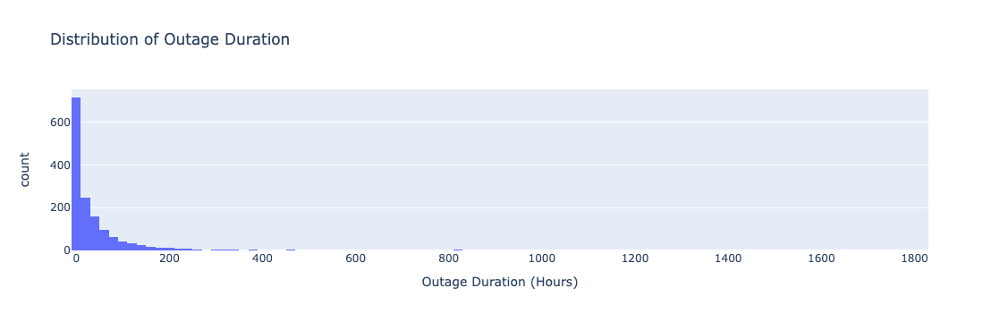

In [58]:
# univariate plot 1 -> distribution of OUTAGE.DURATION
fig = px.histogram(
    outage_df,
    x="OUTAGE.DURATION",
    title="Distribution of Outage Duration",
    labels={"OUTAGE.DURATION": "Outage Duration (Hours)"}
)
fig.show()

# shows that outage duration is extremely right-skewed - longer durations aren't as likely

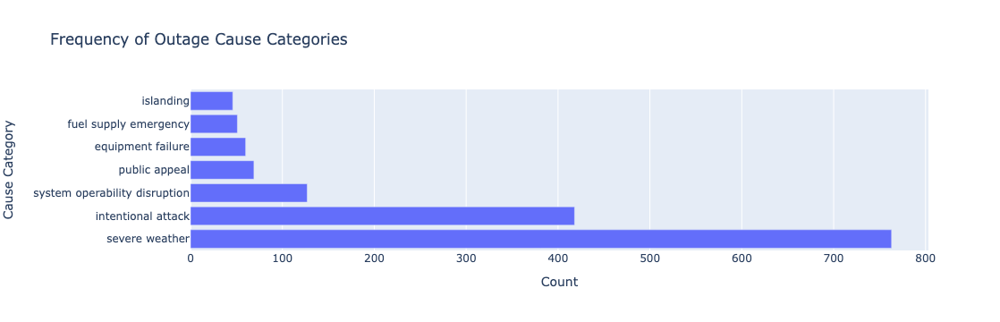

In [59]:
# univariate plot 2 -> distribution of cause categories
fig = px.bar(
    outage_df['CAUSE.CATEGORY'].value_counts().reset_index(),
    x='count',
    y='CAUSE.CATEGORY',
    title='Frequency of Outage Cause Categories',
    labels={'CAUSE.CATEGORY': 'Cause Category', 'count': 'Count'}
)
fig.show()
# severe weather outages are the most prevalent in this dataset

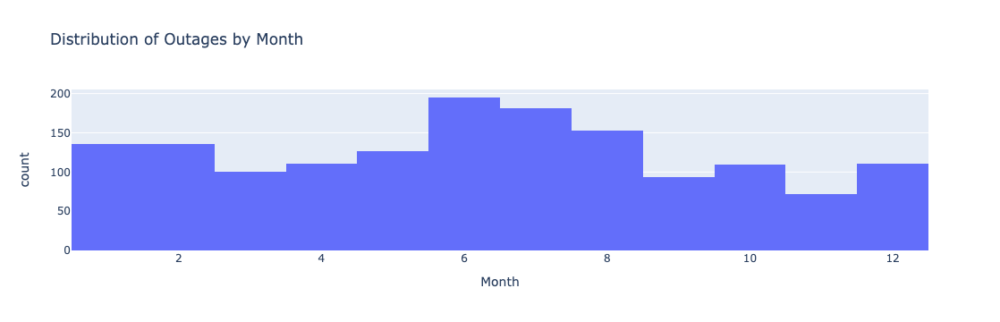

In [60]:
# univariate plot 3 -> distribution of outages by start month
fig = px.histogram(
    outage_df,
    x="MONTH",
    title="Distribution of Outages by Month",
    labels={'MONTH': 'Month'}
)
fig.show()
# center of histogram is around the summer months - where most natural disasters are likely to happen

For my bivariate plots, I chose to examine the following relationships:
1. Examining the duration of outages by cause category to see if particular categories have longer/shorter durations
2. Plotting outage duration vs. customers affected, as usually longer durations should affect more customers
3. Plotting mean outage duration by state using folium to see which states have longer average outage durations

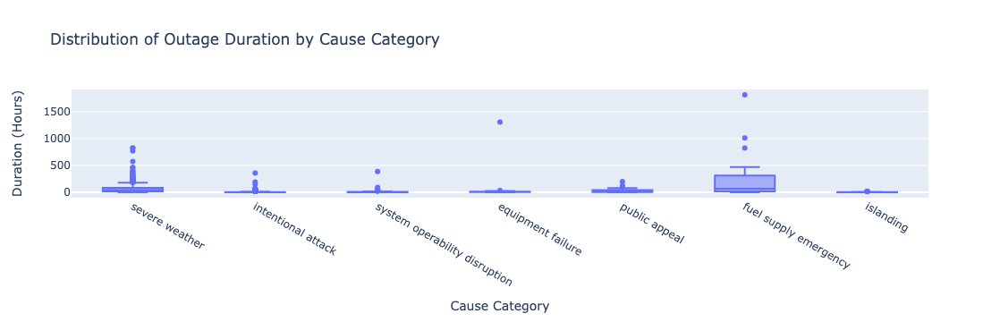

In [61]:
# bivariate plot 1 -> examining the distribution of outage durations, segmented by the cause category
fig = px.box(
    outage_df,
    x='CAUSE.CATEGORY',
    y='OUTAGE.DURATION',
    title='Distribution of Outage Duration by Cause Category',
    labels={'CAUSE.CATEGORY': 'Cause Category', 'OUTAGE.DURATION': 'Duration (Hours)'}
)
fig.show()
# generally all have similar distributions

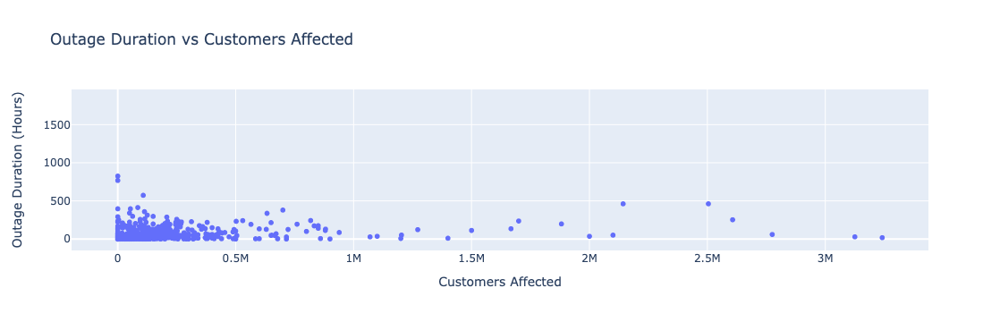

In [62]:
# bivariate plot 2 -> examining for any linear relationship between the number of customers affected and the outage duration
fig = px.scatter(
    outage_df,
    x="CUSTOMERS.AFFECTED",
    y="OUTAGE.DURATION",
    title="Outage Duration vs Customers Affected",
    labels={
        "CUSTOMERS.AFFECTED": "Customers Affected",
        "OUTAGE.DURATION": "Outage Duration (Hours)"
    }
)
fig.update_layout()
fig.show()
# a very weak positive association is present between the two variables

In [63]:
import json
import folium
import pandas as pd

geo_url = "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json"

import requests
states_geo = requests.get(geo_url).json()

Interesting Aggregate 1: This grouped table shows the mean outage duration for each state, allowing us to determine which states have longer/shorter outages on average

In [64]:
# mean outage duration by state
state_duration = (
    outage_df.groupby("U.S._STATE", observed = True)["OUTAGE.DURATION"]
    .mean()
    .reset_index()
)
state_duration.head()

,U.S._STATE,OUTAGE.DURATION
0,Alabama,19.213333
1,Alaska,NaN
2,Arizona,75.882000
3,Arkansas,25.239333
4,California,27.777357


In [65]:
m = folium.Map(location=[37.8, -96], zoom_start=4)

folium.Choropleth(
    geo_data=states_geo,
    data=state_duration,
    columns=['U.S._STATE', 'OUTAGE.DURATION'],
    key_on='feature.properties.name',
    legend_name='Average Outage Duration (Hours)',
).add_to(m)

In [66]:
m

Interesting Aggregate 2: Mean Outage Duration per State by Cause Category -> allows for a further deep dive into the outage duration segmented by state and category

In [67]:
pivot = pd.pivot_table(
    outage_df,
    values="OUTAGE.DURATION",
    index="U.S._STATE",
    columns="CAUSE.CATEGORY",
    aggfunc="mean",
    observed=True
)

In [68]:
pivot.head()

CAUSE.CATEGORY,equipment failure,fuel supply emergency,intentional attack,islanding,public appeal,severe weather,system operability disruption
U.S._STATE,,,,,,,
Alabama,NaN,NaN,1.283333,NaN,NaN,23.695833,NaN
Arizona,2.308333,NaN,10.660000,NaN,NaN,428.775000,6.408333
Arkansas,1.750000,NaN,9.130556,0.050000,17.728571,45.030000,NaN
California,8.746825,102.676667,15.774306,3.580952,33.801852,48.806219,6.061111
Colorado,NaN,NaN,1.950000,0.033333,NaN,45.454167,4.662500


## Step 3: Assessment of Missingness

One column that is NMAR is HURRICANE.NAMES. This is because if the outage is not caused by a hurricane, the column will be empty, meaning that the value's missingness is dependent on the value itself (whether or not this is a hurricane-related entry). We could make this missingness MAR by having a column that simply indicates whether or not this is a hurricane-related outage, thus making the missingness of the name column dependent on the value of this indicator column. 

In [69]:
# let's examine the CLIMATE.CATEGORY column
outage_df['CLIMATE.CATEGORY'].head()

OBS
1    normal
2    normal
3      cold
4    normal
5      warm
Name: CLIMATE.CATEGORY, dtype: object

In [70]:
# create missingness indicator
missing_test_df = outage_df.copy()
missing_test_df['MISSING_CLIMATE.CATEGORY'] = missing_test_df['CLIMATE.CATEGORY'].isna()
# should match the 9 we saw earlier
missing_test_df['MISSING_CLIMATE.CATEGORY'].sum()

np.int64(9)

The column CLIMATE.CATEGORY represents the "climate episode" of the year the entry corresponds. Let's see if this column's missingness is MAR with the STATE in its entry by running a permutation test.

**H0**: The distribution of U.S_STATE when CLIMATE.CATEGORY is missing is equal to the distribution of U.S_STATE when CLIMATE.CATEGORY is not missing.

**H1**: The two distributions are not equal to each other.

In [71]:
# convert US._STATE to category dtype for proper calculations in future steps
missing_test_df['U.S._STATE'] = missing_test_df['U.S._STATE'].astype('category')
# the reason behind doing this is when calculating TVD, both distributions need to have the same support, otherwise results will be biased

In [72]:
# calculate observed TVD for state depending on whether or not climate category is missing
climate_missing = missing_test_df[missing_test_df['MISSING_CLIMATE.CATEGORY']]
not_climate_missing = missing_test_df[~missing_test_df['MISSING_CLIMATE.CATEGORY']]

p_1 = climate_missing['U.S._STATE'].value_counts() / len(climate_missing)
p_2 = not_climate_missing['U.S._STATE'].value_counts() / len(not_climate_missing)

obs_tvd = np.abs(p_1 - p_2).sum() / 2
obs_tvd

np.float64(0.8032786885245903)

In [73]:
# run a permutation test with 100000 trials and a significance level of a = 0.05
simulated_tvds = []
labels = missing_test_df['MISSING_CLIMATE.CATEGORY'].values

for _ in range(100000):
    shuffled = np.random.permutation(labels)
    sim_climate_missing = missing_test_df[shuffled]
    sim_not_climate_missing = missing_test_df[~shuffled]
    
    p_1 = sim_climate_missing['U.S._STATE'].value_counts() / len(sim_climate_missing)
    p_2 = sim_not_climate_missing['U.S._STATE'].value_counts() / len(sim_not_climate_missing)

    simulated_tvds.append(np.abs(p_1 - p_2).sum() / 2)

simulated_tvds[:5]

[np.float64(0.7665573770491803),
 np.float64(0.670528233151184),
 np.float64(0.6281967213114754),
 np.float64(0.7377049180327869),
 np.float64(0.5636429872495446)]

In [74]:
simulated_tvds = np.array(simulated_tvds)
print(f"p = {(simulated_tvds >= obs_tvd).mean()}")

p = 0.04346


Since our p-value of 0.04346 is less than a significance level of 0.05, we **reject** H0. It's likely that the distribution of state when the climate category is missing is different than the distribution of state when the climate category is not missing.

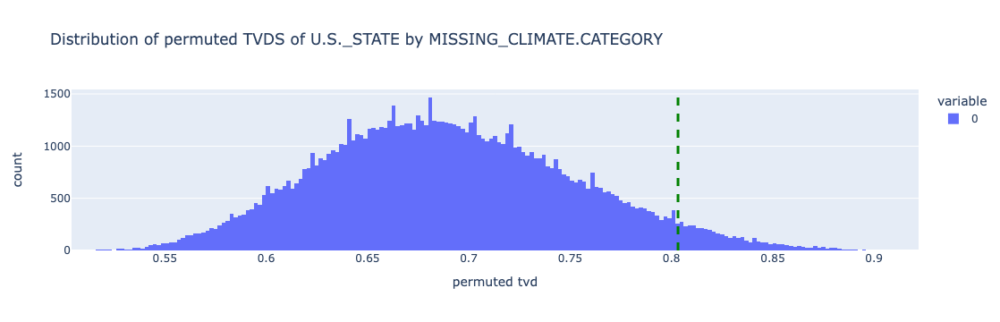

In [75]:
# plot the empirical distribution as well as our test statistic
hist = px.histogram(simulated_tvds, title = "Distribution of permuted TVDS of U.S._STATE by MISSING_CLIMATE.CATEGORY", 
                    labels={"value": "permuted tvd"})
hist.add_vline(x=obs_tvd, line_width=3, line_dash="dash", line_color="green")
hist.show()

Now, let's see if climate category's missingness is dependent on the customers affected column (CUSTOMERS.AFFECTED)

**H0**: Mean CUSTOMERS.AFFECTED when CLIMATE.CATEGORY is missing is equal to the mean CUSTOMERS.AFFECTED when CLIMATE.CATEGORY is not missing.

**H1**: Mean CUSTOMERS.AFFECTED when CLIMATE.CATEGORY is missing is not equal to the mean CUSTOMERS.AFFECTED when CLIMATE.CATEGORY is not missing.

In [76]:
climate_missing = missing_test_df[missing_test_df['MISSING_CLIMATE.CATEGORY']]
not_climate_missing = missing_test_df[~missing_test_df['MISSING_CLIMATE.CATEGORY']]

obs_diff = not_climate_missing['CUSTOMERS.AFFECTED'].mean() - climate_missing['CUSTOMERS.AFFECTED'].mean()
obs_diff

np.float64(60232.25224037956)

In [29]:
# run a permutation test with 100000 trials and a significance level of a = 0.05
simulated_diffs = []
labels = missing_test_df['MISSING_CLIMATE.CATEGORY'].values

for _ in range(100000):
    shuffled = np.random.permutation(labels)
    sim_climate_missing = missing_test_df[shuffled]
    sim_not_climate_missing = missing_test_df[~shuffled]

    simulated_diffs.append(sim_not_climate_missing['CUSTOMERS.AFFECTED'].mean() - sim_climate_missing['CUSTOMERS.AFFECTED'].mean())

simulated_diffs[:5]

[np.float64(14025.902762430924),
 np.float64(18558.117204301074),
 np.float64(69743.27622561941),
 np.float64(25573.42449355434),
 np.float64(-39332.31521237304)]

In [30]:
simulated_diffs = np.array(simulated_diffs)
print(f"p = {((np.abs(simulated_diffs) >= np.abs(obs_diff)).mean())}")

p = 0.50028


Since our p-value of 0.50028 is greater than a significance level of 0.05, we **fail to reject** H0. It's likely that the mean customers affected when the climate category is missing is equal to the mean customers when the climate category is not missing. 

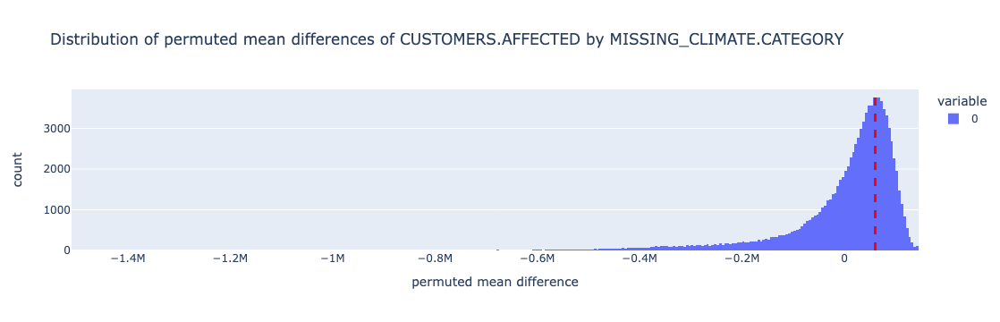

In [33]:
# plot the empirical distribution as well as our test statistic
hist = px.histogram(simulated_diffs, title = "Distribution of permuted mean differences of CUSTOMERS.AFFECTED by MISSING_CLIMATE.CATEGORY",
                   labels={"value": "permuted mean difference"})
hist.add_vline(x=obs_diff, line_width=3, line_dash="dash", line_color="red")
hist.show()

## Step 4: Hypothesis Testing

Let's analyze the average outage duration for outages caused by severe weather compared to the average outage duration for outages not caused by severe weather.

**H0**: The average outage duration for outages caused by severe weather is the same as the average outage duration for outages not caused by severe weather (Dbar for severe weather - Dbar for non-severe weather = 0)

**H1**: The average outage duration for outages caused by severe weather is greater than the average outage duration for outages not caused by severe weather (Dbar for severe weather - Dbar for non-severe weather > 0)

In [88]:
severe_weather_duration = outage_df[outage_df['CAUSE.CATEGORY'] == 'severe weather']['OUTAGE.DURATION'].mean()
nonsevere_weather_duration = outage_df[outage_df['CAUSE.CATEGORY'] != 'severe weather']['OUTAGE.DURATION'].mean()

obs = severe_weather_duration - nonsevere_weather_duration
print(f"observed diff = {obs}")

observed diff = 42.27376718667372


In [89]:
labels = outage_df['CAUSE.CATEGORY'].values

distr = []
for _ in range(10000):
    shuffled = np.random.permutation(labels)
    severe_mean = outage_df[shuffled == 'severe weather']['OUTAGE.DURATION'].mean()
    nonsevere_mean = outage_df[shuffled != 'severe weather']['OUTAGE.DURATION'].mean()
    distr.append(severe_mean - nonsevere_mean)
distr = np.array(distr)

In [90]:
print(f"p = {(distr >= obs).mean()}")

p = 0.0


Since this p-value of 0.0 is below a standard significance level of 0.05, we **reject** H0. It's likely that the average outage duration for outages caused by severe weather is greater than the average outage duration for outages not caused by severe weather

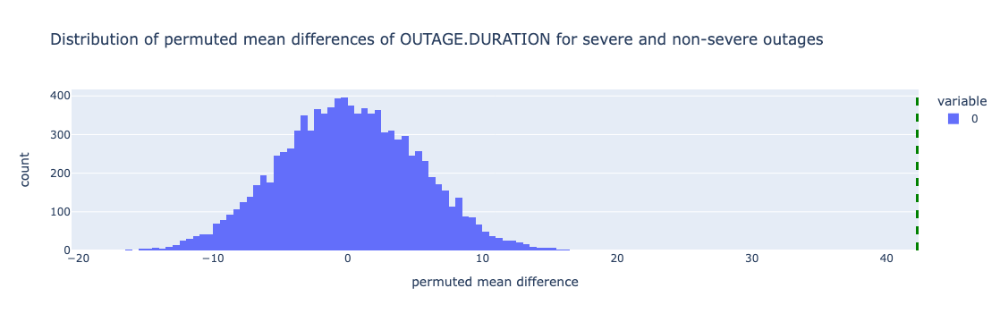

In [92]:
# plot the empirical distribution as well as our test statistic
hist = px.histogram(distr, title = "Distribution of permuted mean differences of OUTAGE.DURATION for severe and non-severe outages", 
                   labels={"value": "permuted mean difference"})
hist.add_vline(x=obs, line_width=3, line_dash="dash", line_color="green")
hist.show()

## Step 5: Framing a Prediction Problem

**Prediction Problem:** Can we predict the duration of a outage using only meaningful information known at the onset of the outage?

This would be a regression problem, as OUTAGE.DURATION is a quantiative and continuous variable. I chose this variable because this would be the most useful variable to predict for real-world situations, if people could have a quality estimate of how long their power outages would last based on current situational data, they could prepare and establish the necessary safety measures in their communities. The metric I'll be mainly using to evaluate my model is RMSE, because regression problems require continuous measures of error and RMSE penalizes larger errors more heavily and offers a more math-friendly approach to optimizing parameters. I'll also compare this performance with MAE, to ensure that the model consistently performs across different metrics.

Only data known at the onset of the outage, such as regional data and outage causes, will be used to make predictions. Data determined after the outage will not be used to train the model. 

## Step 6: Baseline Model

In [95]:
# manually extract all columns known at the onset of the outage
onset_columns = [
    "YEAR",
    "MONTH",
    "U.S._STATE",
    "POSTAL.CODE",
    "NERC.REGION",
    "CLIMATE.REGION",
    "ANOMALY.LEVEL",
    "CLIMATE.CATEGORY",
    "OUTAGE.START.DATE",
    "OUTAGE.START.TIME",
    "CAUSE.CATEGORY",
    "CAUSE.CATEGORY.DETAIL",
    "HURRICANE.NAMES",
    "RES.PRICE",
    "COM.PRICE",
    "IND.PRICE",
    "TOTAL.PRICE",
    "RES.SALES",
    "COM.SALES",
    "IND.SALES",
    "TOTAL.SALES",
    "RES.PERCEN",
    "COM.PERCEN",
    "IND.PERCEN",
    "RES.CUSTOMERS",
    "COM.CUSTOMERS",
    "IND.CUSTOMERS",
    "TOTAL.CUSTOMERS",
    "RES.CUST.PCT",
    "COM.CUST.PCT",
    "IND.CUST.PCT",
    "PC.REALGSP.STATE",
    "PC.REALGSP.USA",
    "PC.REALGSP.REL",
    "PC.REALGSP.CHANGE",
    "UTIL.REALGSP",
    "TOTAL.REALGSP",
    "UTIL.CONTRI",
    "PI.UTIL.OFUSA",
    "POPULATION",
    "POPPCT_URBAN",
    "POPPCT_UC",
    "POPDEN_URBAN",
    "POPDEN_UC",
    "POPDEN_RURAL",
    "AREAPCT_URBAN",
    "AREAPCT_UC",
    "PCT_LAND",
    "PCT_WATER_TOT",
    "PCT_WATER_INLAND"
]

In [96]:
# Drop rows where the target is missing
model_df = outage_df.dropna(subset=['OUTAGE.DURATION'])

# Build the modeling DataFrame with all needed features
model_df = model_df[onset_columns + ['OUTAGE.DURATION']]

In [97]:
# analyze missingness of these columns
for feature in onset_columns:
    print(f"{feature} has {model_df[feature].isna().sum()} null values")

YEAR has 0 null values
MONTH has 0 null values
U.S._STATE has 0 null values
POSTAL.CODE has 0 null values
NERC.REGION has 0 null values
CLIMATE.REGION has 5 null values
ANOMALY.LEVEL has 0 null values
CLIMATE.CATEGORY has 0 null values
OUTAGE.START.DATE has 0 null values
OUTAGE.START.TIME has 0 null values
CAUSE.CATEGORY has 0 null values
CAUSE.CATEGORY.DETAIL has 448 null values
HURRICANE.NAMES has 1405 null values
RES.PRICE has 12 null values
COM.PRICE has 12 null values
IND.PRICE has 12 null values
TOTAL.PRICE has 12 null values
RES.SALES has 12 null values
COM.SALES has 12 null values
IND.SALES has 12 null values
TOTAL.SALES has 12 null values
RES.PERCEN has 12 null values
COM.PERCEN has 12 null values
IND.PERCEN has 12 null values
RES.CUSTOMERS has 0 null values
COM.CUSTOMERS has 0 null values
IND.CUSTOMERS has 0 null values
TOTAL.CUSTOMERS has 0 null values
RES.CUST.PCT has 0 null values
COM.CUST.PCT has 0 null values
IND.CUST.PCT has 0 null values
PC.REALGSP.STATE has 0 null val

For these null counts, there's only one column that appears to have non-trivial missingness and thus is not suited for imputation: HURRICANE.NAMES. This is because it has a very large proportion of missing values, and from Step 3, we recognized that HURRICANE.NAMES is an NMAR column (the row is missing if the outage cause is not a hurricane). As such, I will be excluding this variable from the modeling pipeline.

For the rest of the columns, we can identify that they have trivial missingness (5-12 missing values). This is well under 1% of the actual numbers of rows of data, and at first glance there does not appear to be any structural missingness patterns in these columns. We can include CAUSE.CATEGORY.DETAIL because that's just an optional column that specifies any additional details for the cause of the outage (can encode this column as None through one-hot-encoding). We will impute all numeric columns with the median (robust to skewness) and categorical columns with the mode (preserves the most common category, suitable for small amounts of missingness) for our **final model** because these are safe imputation values that won't skew the existing distribution of values for the distribution of these variables (regardless of the shape of their actual distributions). 

In [98]:
# feature list for final model
categorical_features = [
    'YEAR', 'MONTH', 'U.S._STATE', 'POSTAL.CODE', 'NERC.REGION',
    'CLIMATE.REGION', 'ANOMALY.LEVEL', 'CLIMATE.CATEGORY',
    'OUTAGE.START.DATE', 'OUTAGE.START.TIME',
    'CAUSE.CATEGORY', 'CAUSE.CATEGORY.DETAIL'
]

numeric_features = [
    'RES.PRICE', 'COM.PRICE', 'IND.PRICE', 'TOTAL.PRICE',
    'RES.SALES', 'COM.SALES', 'IND.SALES', 'TOTAL.SALES',
    'RES.PERCEN', 'COM.PERCEN', 'IND.PERCEN',
    'RES.CUSTOMERS', 'COM.CUSTOMERS', 'IND.CUSTOMERS', 'TOTAL.CUSTOMERS',
    'RES.CUST.PCT', 'COM.CUST.PCT', 'IND.CUST.PCT',
    'PC.REALGSP.STATE', 'PC.REALGSP.USA', 'PC.REALGSP.REL',
    'PC.REALGSP.CHANGE', 'UTIL.REALGSP', 'TOTAL.REALGSP',
    'UTIL.CONTRI', 'PI.UTIL.OFUSA',
    'POPULATION', 'POPPCT_URBAN', 'POPPCT_UC',
    'POPDEN_URBAN', 'POPDEN_UC', 'POPDEN_RURAL',
    'AREAPCT_URBAN', 'AREAPCT_UC', 'PCT_LAND',
    'PCT_WATER_TOT', 'PCT_WATER_INLAND'
]

all_features = categorical_features + numeric_features

In [99]:
# check for null values
for feature in all_features:
    print(f"{feature} has {model_df[feature].isna().sum()} null values")

YEAR has 0 null values
MONTH has 0 null values
U.S._STATE has 0 null values
POSTAL.CODE has 0 null values
NERC.REGION has 0 null values
CLIMATE.REGION has 5 null values
ANOMALY.LEVEL has 0 null values
CLIMATE.CATEGORY has 0 null values
OUTAGE.START.DATE has 0 null values
OUTAGE.START.TIME has 0 null values
CAUSE.CATEGORY has 0 null values
CAUSE.CATEGORY.DETAIL has 448 null values
RES.PRICE has 12 null values
COM.PRICE has 12 null values
IND.PRICE has 12 null values
TOTAL.PRICE has 12 null values
RES.SALES has 12 null values
COM.SALES has 12 null values
IND.SALES has 12 null values
TOTAL.SALES has 12 null values
RES.PERCEN has 12 null values
COM.PERCEN has 12 null values
IND.PERCEN has 12 null values
RES.CUSTOMERS has 0 null values
COM.CUSTOMERS has 0 null values
IND.CUSTOMERS has 0 null values
TOTAL.CUSTOMERS has 0 null values
RES.CUST.PCT has 0 null values
COM.CUST.PCT has 0 null values
IND.CUST.PCT has 0 null values
PC.REALGSP.STATE has 0 null values
PC.REALGSP.USA has 0 null values


In [100]:
X = model_df[all_features]
y = model_df['OUTAGE.DURATION']

In [101]:
X.head()

,YEAR,MONTH,U.S._STATE,POSTAL.CODE,NERC.REGION,CLIMATE.REGION,ANOMALY.LEVEL,CLIMATE.CATEGORY,OUTAGE.START.DATE,OUTAGE.START.TIME,...,POPPCT_URBAN,POPPCT_UC,POPDEN_URBAN,POPDEN_UC,POPDEN_RURAL,AREAPCT_URBAN,AREAPCT_UC,PCT_LAND,PCT_WATER_TOT,PCT_WATER_INLAND
OBS,,,,,,,,,,,,,,,,,,,,,
1,2011,7.0,Minnesota,MN,MRO,East North Central,-0.3,normal,"Friday, July 01, 2011",5:00:00 PM,...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743
2,2014,5.0,Minnesota,MN,MRO,East North Central,-0.1,normal,"Sunday, May 11, 2014",6:38:00 PM,...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743
3,2010,10.0,Minnesota,MN,MRO,East North Central,-1.5,cold,"Tuesday, October 26, 2010",8:00:00 PM,...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743
4,2012,6.0,Minnesota,MN,MRO,East North Central,-0.1,normal,"Tuesday, June 19, 2012",4:30:00 AM,...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743
5,2015,7.0,Minnesota,MN,MRO,East North Central,1.2,warm,"Saturday, July 18, 2015",2:00:00 AM,...,73.27,15.28,2279.0,1700.5,18.2,2.14,0.6,91.592666,8.407334,5.478743


In [102]:
y.head()

OBS
1    51.000000
2     0.016667
3    50.000000
4    42.500000
5    29.000000
Name: OUTAGE.DURATION, dtype: float64

To start with the baseline regression model, let's use U.S._STATE (nominal, one-hot encoded), CAUSE.CATEGORY (nominal, one-hot encoded), and TOTAL.CUSTOMERS (quantitative) to predict OUTAGE.DURATION. These columns have no missing values, so we won't need to run any imputation here.

In [103]:
# train-test split with 0.2 test size
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

In [104]:
# build pipeline for entire model training
ct = ColumnTransformer(
    transformers = [("ohe", OneHotEncoder(drop='first', handle_unknown='ignore'), ['U.S._STATE', 'CAUSE.CATEGORY']), 
                    ("scale", StandardScaler(), ['TOTAL.CUSTOMERS'])]
)

pl = Pipeline([
    ('preprocessor', ct), 
    ('lin-reg', LinearRegression())
])

In [105]:
pl.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ohe',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['U.S._STATE',
                                                   'CAUSE.CATEGORY']),
                                                 ('scale', StandardScaler(),
                                                  ['TOTAL.CUSTOMERS'])])),
                ('lin-reg', LinearRegression())])

In [106]:
# R^2 on train and test
print(f"Baseline R^2 train = {pl.score(X_train, y_train)}")
print(f"Baseline R^2 test = {pl.score(X_test, y_test)}")
# eval RMSE on train and test set
print(f"Baseline RMSE on train = {root_mean_squared_error(y_train, pl.predict(X_train))}")
print(f"Baseline RMSE on test = {root_mean_squared_error(y_test, pl.predict(X_test))}")

Baseline R^2 train = 0.2241636662121359
Baseline R^2 test = 0.1494085239683144
Baseline RMSE on train = 78.70499777006609
Baseline RMSE on test = 120.44510635777436


The model achieves a train R² of 0.224 and test R² of 0.149, indicating that it explains only a small portion of the variance in outage duration. RMSE values of 78.705 hours (train) and 120.445 hours (test) show that predictions are typically off by several days. This is expected for this simple baseline model.

## Step 7: Final Model

Let's improve the model by incorporating all the direct features from earlier into our linear regression pipeline. We will need to set up a system to impute values, so we will use sklearn's SimpleImputer package to impute values into our numeric and categorical columns respectively.

Furthermore, for numeric features, I'll be adding a *QuantileTransformer* feature which will make the distribution of the feature normal and eliminate heavy skew, and a *PolynomialFeatures* feature with degree 2, which will allow interaction and quadratic features to be created among numeric variables, allowing the model to learn nonlinear relationships without manual feature construction. 

In [56]:
numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

final_preprocessor = ColumnTransformer(
    transformers=[
        ("cat", Pipeline([
            ("imputer", categorical_imputer),
            ("ohe", OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_features),
        
        ("num", Pipeline([
            ("imputer", numeric_imputer),
            ("scale", StandardScaler())
        ]), numeric_features),

        ("qt", Pipeline([
            ("imputer", numeric_imputer),
            ("qt", QuantileTransformer(output_distribution="normal", n_quantiles=100))
        ]), numeric_features),

        ("poly", Pipeline([
            ("imputer", numeric_imputer),
            ("poly", PolynomialFeatures(degree=2, include_bias=False))
        ]), numeric_features)
    ], remainder='drop'
)

final_linear_model = Pipeline([
    ('preprocessor', final_preprocessor),
    ('model', LinearRegression())
])

In [57]:
final_linear_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['YEAR', 'MONTH',
                                                   'U.S._STATE', 'POSTAL.CODE',
                                                   'NERC.REGION',
                                                   'CLIMATE.REGION',
                                                   'ANOMALY.LEVEL',
                                                   'CLIMATE.CATEGORY',
                                                   'OUTAGE.START.DATE',
                                                   'OUTAGE.START.TIME',
                                                   'CAUSE.CATEGO...
                                                   'IND.PERCEN',
                                                   'RES.CUSTOMERS',
                                                   'COM.CUSTOMERS',
                                                   'IND.CUSTOMERS',
                                                   'TOTAL.CUSTOMERS',
                                                   'RES.CUST.PCT',
                                                   'COM.CUST.PCT',
                                                   'IND.CUST.PCT',
                                                   'PC.REALGSP.STATE',
                                                   'PC.REALGSP.USA',
                                                   'PC.REALGSP.REL',
                                                   'PC.REALGSP.CHANGE',
                                                   'UTIL.REALGSP',
                                                   'TOTAL.REALGSP',
                                                   'UTIL.CONTRI',
                                                   'PI.UTIL.OFUSA',
                                                   'POPULATION', 'POPPCT_URBAN',
                                                   'POPPCT_UC', 'POPDEN_URBAN', ...])])),
                ('model', LinearRegression())])

In [58]:
# R^2 on train and test
print(f"R^2 train = {final_linear_model.score(X_train, y_train)}")
print(f"R^2 test = {final_linear_model.score(X_test, y_test)}")
# eval RMSE on train and test set
print(f"RMSE on train = {root_mean_squared_error(y_train, final_linear_model.predict(X_train))}")
print(f"RMSE on test = {root_mean_squared_error(y_test, final_linear_model.predict(X_test))}")

Improved R^2 train = 0.617503005652183
Improved R^2 test = -484.02863032938984
Improved RMSE on train = 55.26259405943467
Improved RMSE on test = 2876.1553095374506


As we see, while the train accuracy improved, our model is shown to catastrophically overfit to the data, having a large, negative R² value. This means that the model is actually doing **worse** at predicting unseen data than using a simple baseline model. This shows that a linear regression model struggles to capture the patterns in the data due to the high dimensionality and correlated features. A random forest model should do a better job at handling these complex relationships and generalize better to unseen data.

To train our RandomForestRegressor, we need to decide what hyperparameters we would like to tune and the specific values to tune them to. Below is the parameter grid for our hyperparameters.

In [107]:
# parameter grid for the hyperparameters
param_grid = {
    "model__n_estimators": [200, 250, 300, 350, 400],
    "model__max_depth": [10, 20, None],
    "model__min_samples_split": [2, 5],
    "model__min_samples_leaf": [1, 2]
}

**n_estimators - number of trees:** Ranging from 200-400, this gives us a good choice of the number of trees to vote from without having too many trees and taking up unnecessary runtime. 

**max_depth - the max depth each tree can go:** This controls how far each tree can go, each having the risk of underfitting or overfitting. A depth of 10 is quite shallow but can reduce overfitting. A depth of 20 is medium-depth and could capture the complex patterns that we need. None allows for fully grown trees which could capture the depth of the complexity, but at the cost of overfitting. 

**min_samples_split - minimum samples required before splitting:** Choosing 2 versus 5 allows the model to either to be highly flexible (could overfit) or be more conservative when performing splits. 

**min_samples_leaf - minimum samples in a leaf node:** Choosing between 1 or 2 allows for very granular leaves or for smoother final predictions - just a tune-up for the final prediction rule. 

Running a GridSearchCV on this parameter grid will give us 5 * 3 * 2 * 2 = 60 parameter combinations. Running this with 3-fold cross validation, GridSearchCV will train a total of 180 models. 

In [60]:
rf = RandomForestRegressor(random_state=42)

rf_pipeline = Pipeline([
    ("preprocessor", final_preprocessor),
    ("model", rf)
])

In [61]:
# grid search CV for optimal params
grid = GridSearchCV(
    rf_pipeline, param_grid,
    scoring="neg_mean_squared_error",
    cv=3, n_jobs=-1, verbose=1
)

grid.fit(X_train, y_train)

Fitting 3 folds for each of 60 candidates, totalling 180 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('cat',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['YEAR',
                                                                          'MONTH',
                                                                          'U.S._STATE',
                                                                          'POSTAL.CODE',
                                                                          'NERC.REGION',
                                                                          'CLIMATE.REGION',
                                                                          'ANOMALY.LEVEL',
                                                                          'CLIMATE.CATEGORY',
                                                                          'OUTAGE.START.DATE',
                                                                          'OUTA...
                                                                          'UTIL.CONTRI',
                                                                          'PI.UTIL.OFUSA',
                                                                          'POPULATION',
                                                                          'POPPCT_URBAN',
                                                                          'POPPCT_UC',
                                                                          'POPDEN_URBAN', ...])])),
                                       ('model',
                                        RandomForestRegressor(random_state=42))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [10, 20, None],
                         'model__min_samples_leaf': [1, 2],
                         'model__min_samples_split': [2, 5],
                         'model__n_estimators': [200, 250, 300, 350, 400]},
             scoring='neg_mean_squared_error', verbose=1)

In [111]:
# model's optimal parameters
print(grid.best_params_)

{'model__max_depth': 10, 'model__min_samples_leaf': 2, 'model__min_samples_split': 5, 'model__n_estimators': 200}


In [112]:
best_model = grid.best_estimator_
train_pred = best_model.predict(X_train)
test_pred = best_model.predict(X_test)

print(f"R^2 train = {r2_score(y_train, train_pred)}")
print(f"R^2 train = {r2_score(y_test, test_pred)}")
print(f"RMSE on train = {root_mean_squared_error(y_train, train_pred)}")
print(f"RMSE on test = {root_mean_squared_error(y_test, test_pred)}")

R^2 train = 0.6443186555622549
R^2 train = 0.3301826691266052
RMSE on train = 53.2902548487401
RMSE on test = 106.88255734728345


Here, we see a significant improvement in both train and test performance from the baseline (RMSE test went from ~120 to ~107 hours), indicating that our Random Forest model is a better fit for the complexity of our dataset. 

## Step 8: Fairness Analysis

For our fairness analysis, we will examine if our model fairly predicts both outages caused by severe weather and outages caused by non severe weather. We will use RMSE as our accuracy metric, and thus our test statistic will be the difference in RMSE of the two groups:

**D = RMSE(severe weather) - RMSE(non-severe weather)**

Here are our statistical hypotheses:

**H0:** The model is fair. The difference in RMSE between severe and non-severe outages is due to chance.

E(D) **=** 0

**H1:** The model is unfair. The RMSE differs statistically between groups.

E(D) **!=** 0

We will perform this permutation test on our test dataset (what the model hasn't seen yet).

In [120]:
fairness_df = X_test.copy()
fairness_df['true'] = y_test
fairness_df['pred'] = test_pred
fairness_df['residual'] = fairness_df['true'] - fairness_df['pred']

fairness_df.head()

,YEAR,MONTH,U.S._STATE,POSTAL.CODE,NERC.REGION,CLIMATE.REGION,ANOMALY.LEVEL,CLIMATE.CATEGORY,OUTAGE.START.DATE,OUTAGE.START.TIME,...,POPDEN_UC,POPDEN_RURAL,AREAPCT_URBAN,AREAPCT_UC,PCT_LAND,PCT_WATER_TOT,PCT_WATER_INLAND,true,pred,residual
OBS,,,,,,,,,,,,,,,,,,,,,
1165,2003,12.0,California,CA,WECC,West,0.3,normal,"Monday, December 22, 2003",11:15:00 AM,...,2124.1,12.7,5.28,0.59,95.164177,4.835823,1.730658,12.016667,194.650079,-182.633412
190,2012,3.0,Texas,TX,TRE,South,-0.4,normal,"Tuesday, March 20, 2012",8:00:00 AM,...,1539.9,15.2,3.35,0.58,97.258336,2.742036,2.090873,5.000000,43.774227,-38.774227
1273,2008,2.0,California,CA,WECC,West,-1.3,cold,"Saturday, February 09, 2008",11:59:00 AM,...,2124.1,12.7,5.28,0.59,95.164177,4.835823,1.730658,3.566667,7.805959,-4.239292
72,2012,10.0,West Virginia,WV,RFC,Central,0.3,normal,"Monday, October 29, 2012",12:00:00 AM,...,1326.4,40.6,2.66,0.90,99.207594,0.792406,0.792406,287.983333,79.545611,208.437722
227,2012,1.0,Texas,TX,TRE,South,-0.7,cold,"Tuesday, January 10, 2012",9:30:00 PM,...,1539.9,15.2,3.35,0.58,97.258336,2.742036,2.090873,0.000000,8.816372,-8.816372


In [114]:
group_severe = fairness_df[fairness_df['CAUSE.CATEGORY'] == 'severe weather']
group_nonsevere = fairness_df[fairness_df['CAUSE.CATEGORY'] != 'severe weather']

rmse_X = root_mean_squared_error(group_severe['true'], group_severe['pred'])
rmse_Y = root_mean_squared_error(group_nonsevere['true'], group_nonsevere['pred'])

obs_diff = rmse_X - rmse_Y
obs_diff

np.float64(-51.815569553818676)

In [117]:
# perform with 10000 trials
perm_diffs = []

labels = (fairness_df['CAUSE.CATEGORY'] == 'severe weather').values

for _ in range(10000):
    shuffled = np.random.permutation(labels)

    gsevere = fairness_df[shuffled]
    gnonsevere = fairness_df[~shuffled]

    rmse_X_sim = root_mean_squared_error(gsevere['true'], gsevere['pred'])
    rmse_Y_sim = root_mean_squared_error(gnonsevere['true'], gnonsevere['pred'])

    perm_diffs.append(rmse_X_sim - rmse_Y_sim)

perm_diffs = np.array(perm_diffs)

In [118]:
# two-sided p-value
p_value = np.mean(np.abs(perm_diffs) >= np.abs(obs_diff))
p_value

np.float64(1.0)

Since this p-value of 1.0 is well above a standard significance level of 0.05, we **fail to reject** H0. It's likely that our model is fair and does not differ systematically for predictions between the groups of severe and non-severe weather outages.